# OSK FRiP

Per single-cell, look at fraction of reads in peaks with at least one OSK instance, and also combinations of OSK. Can also repeat with ChIP-seq hits.

In [ ]:
library(ggplot2)
library(GenomicRanges)
library(rtracklayer)
library(Matrix)
library(scales)
library(patchwork)
library(RColorBrewer)
library(DESeq2)

In [115]:
qual_col_pals = brewer.pal.info[brewer.pal.info$category == 'qual',]
col_vector = unlist(mapply(brewer.pal, qual_col_pals$maxcolors, rownames(qual_col_pals)))

In [13]:
pmat = readMM("../20200206_pmat_snapATAC/sessions/20200520_n68916/pmat.overlap.smallpeaks.sparse.mm")
pmat = as(pmat, "dgCMatrix")
dim(pmat)

[1]  68916 803958

In [24]:
DAYS = c("D0", "D2", "D4", "D6", "D8", "D10", "D12", "D14")

In [14]:
# Metadata file from previous run
# should contain, sample_barcode as rowname, sample, umap1, umap2, cluster
metaData = read.table("../20200206_pmat_snapATAC/sessions/20200520_n68916/metadata.tsv", header = T)
rownames(metaData) = paste(metaData$sample, metaData$barcode, sep='_')
metaData$cells = rownames(metaData) # for cicero
dim(metaData)
head(metaData, 5)

[1] 68916     5

,barcode,sample,umap1,umap2,cells
,<fct>,<fct>,<dbl>,<dbl>,<chr>
D0_AAACAACGACGATTAC,AAACAACGACGATTAC,D0,6.565758,-8.649868,D0_AAACAACGACGATTAC
D0_AAACAACGAGCGCACT,AAACAACGAGCGCACT,D0,5.604522,-7.835411,D0_AAACAACGAGCGCACT
D0_AAACACGCTACGCCAC,AAACACGCTACGCCAC,D0,5.130516,-7.593246,D0_AAACACGCTACGCCAC
D0_AAACACGCTAGTACGG,AAACACGCTAGTACGG,D0,4.926843,-8.365463,D0_AAACACGCTAGTACGG
D0_AAACACGCTCCTCAAA,AAACACGCTCCTCAAA,D0,6.056337,-5.647577,D0_AAACACGCTCCTCAAA


In [21]:
regions = read.table("../20200206_pmat_snapATAC/sessions/20200520_n68916/peaks.overlap.smallpeaks.bed")
names(regions) = c("chr", "bp1", "bp2")
regions$site_name <- paste(regions$chr, regions$bp1, regions$bp2, sep="_")
row.names(regions) <- regions$site_name
dim(regions)
head(regions)

[1] 803958      4

,chr,bp1,bp2,site_name
,<fct>,<int>,<int>,<chr>
chr1_97145604_97145864,chr1,97145604,97145864,chr1_97145604_97145864
chr1_7538148_7538363,chr1,7538148,7538363,chr1_7538148_7538363
chr1_93196678_93196894,chr1,93196678,93196894,chr1_93196678_93196894
chr1_187577713_187577913,chr1,187577713,187577913,chr1_187577713_187577913
chr1_53278065_53278265,chr1,53278065,53278265,chr1_53278065_53278265
chr1_177176832_177177032,chr1,177176832,177177032,chr1_177176832_177177032


In [26]:
peaks_gr = GRanges(sub("_", "-", sub("_", ":", rownames(regions))))

In [28]:
pmatRowSums = Matrix::rowSums(pmat)

In [27]:
# check if reads at OCT promoter (none in initial version)
sum(pmat[,subjectHits(findOverlaps(GRanges(c("chr6:31170549-31170836")), peaks_gr))])

[1] 537

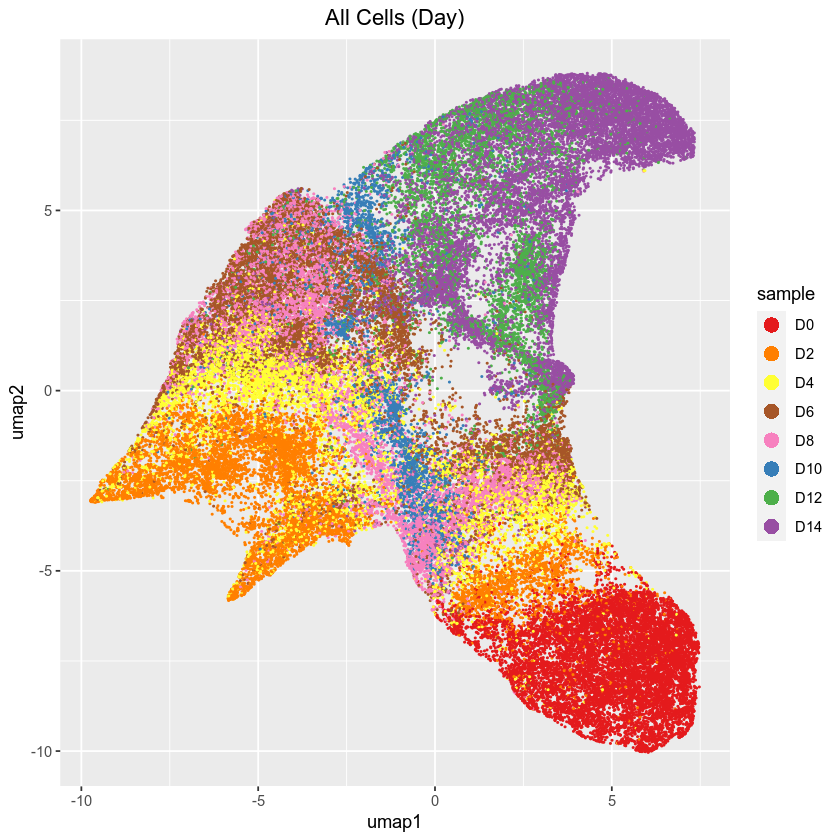

In [25]:
options(repr.plot.width = 7, repr.plot.height = 7)

df = data.frame(umap1=metaData$umap1, 
                umap2=metaData$umap2, 
                sample=metaData$sample)
# shuffle so days don't overlap
df = df[sample(dim(df)[1]), ]

ggplot(df) +
# ggplot(df[df$x.sp.sample %in% c("D14"), ]) +
geom_point(size=0.2, alpha=1, aes(x=umap1 , y=umap2, col=sample)) +
scale_color_brewer(breaks=DAYS, palette = "Set1") +
ggtitle("All Cells (Day)") + 
theme(plot.title = element_text(hjust = 0.5)) + 
guides(colour = guide_legend(override.aes = list(shape=16, alpha=1, size=4))) 

## Load OSK motif hits

In [406]:
OCT4_motif_gr = import("./data/20200307_fine_clustering_20200520_gridmap_peakwidthnorm_n40/OCT4.bed")
SOX2_motif_gr = import("./data/20200307_fine_clustering_20200520_gridmap_peakwidthnorm_n40/SOX2.bed")
KLF4_motif_gr = import("./data/20200307_fine_clustering_20200520_gridmap_peakwidthnorm_n40/KLF4.bed")

In [407]:
# Do not consider fibroblast peaks
D0_peaks_gr = import("/oak/stanford/groups/akundaje/surag/projects/scATAC-reprog/bulk/croo/D0/peak/overlap_reproducibility/overlap.optimal_peak.narrowPeak.gz")
peaks_open_D0 = unique(queryHits(findOverlaps(peaks_gr, D0_peaks_gr)))

In [408]:
peaks_with_O = unique(queryHits(findOverlaps(peaks_gr, OCT4_motif_gr)))
peaks_with_O = peaks_with_O[!peaks_with_O %in% peaks_open_D0]

peaks_with_S = unique(queryHits(findOverlaps(peaks_gr, SOX2_motif_gr)))
peaks_with_S = peaks_with_S[!peaks_with_S %in% peaks_open_D0]

peaks_with_K = unique(queryHits(findOverlaps(peaks_gr, KLF4_motif_gr)))
peaks_with_K = peaks_with_K[!peaks_with_K %in% peaks_open_D0]

In [409]:
length(peaks_with_O)
length(peaks_with_S)
length(peaks_with_K)

[1] 71013

[1] 64443

[1] 114715

In [410]:
peaks_with_O_only = peaks_with_O[!peaks_with_O %in% c(peaks_with_S, peaks_with_K)]
peaks_with_S_only = peaks_with_S[!peaks_with_S %in% c(peaks_with_O, peaks_with_K)]
peaks_with_K_only = peaks_with_K[!peaks_with_K %in% c(peaks_with_S, peaks_with_O)]

In [411]:
length(peaks_with_O_only)
length(peaks_with_S_only)
length(peaks_with_K_only)

[1] 23728

[1] 17948

[1] 98851

In [414]:
peaks_with_OS = unique(intersect(peaks_with_O, peaks_with_S))
peaks_with_OS = peaks_with_OS[!peaks_with_OS %in% peaks_with_K]

peaks_with_SK = intersect(peaks_with_S, peaks_with_K)
peaks_with_SK = peaks_with_SK[!peaks_with_SK %in% peaks_with_O]

peaks_with_OK = intersect(peaks_with_O, peaks_with_K)
peaks_with_OK = peaks_with_OK[!peaks_with_OK %in% peaks_with_S]

peaks_with_OSK = unique(intersect(intersect(peaks_with_O, peaks_with_S), 
                                  peaks_with_K))

In [415]:
length(peaks_with_OS)
length(peaks_with_SK)
length(peaks_with_OK)
length(peaks_with_OSK)

[1] 35598

[1] 4177

[1] 4967

[1] 6720

In [416]:
frac_reads_in_O = Matrix::rowSums(pmat[, peaks_with_O_only])/pmatRowSums
frac_reads_in_S = Matrix::rowSums(pmat[, peaks_with_S_only])/pmatRowSums
frac_reads_in_K = Matrix::rowSums(pmat[, peaks_with_K_only])/pmatRowSums
frac_reads_in_OS = Matrix::rowSums(pmat[, peaks_with_OS])/pmatRowSums
frac_reads_in_SK = Matrix::rowSums(pmat[, peaks_with_SK])/pmatRowSums
frac_reads_in_OK = Matrix::rowSums(pmat[, peaks_with_OK])/pmatRowSums
frac_reads_in_OSK = Matrix::rowSums(pmat[, peaks_with_OSK])/pmatRowSums

## Fraction Reads in Peak Set Plots

In [458]:
get_plot_frac_reads <- function(metaData, frip, gr, title) {
    df = data.frame(metaData, percent_reads=100*frip)
    # shuffle so days don't overlap
    df = df[sample(dim(df)[1]), ]

    p <- ggplot(df) +
    # ggplot(df[df$x.sp.sample %in% c("D14"), ]) +
    geom_point(size=0.1, alpha=1, aes(x=umap1 , y=umap2, col=as.numeric(percent_reads))) +
    ggtitle(sprintf("Percentage of reads in %d Peaks \n with %s Motifs (%d kbp)",  
                   length(gr), title, as.integer(sum(width(gr))/1000))) + 
    xlab("UMAP 1") + ylab("UMAP 2") +
    scale_color_viridis_c(limits=c(quantile(100*frip, 0.05), 
                                   quantile(100*frip, 0.99)), 
                          oob=squish, option = "B") +
    theme_classic() +
    theme(plot.title = element_text(hjust = 0.5),
          text = element_text(size=12),
          axis.line=element_blank(),
          axis.text.x=element_blank(),
          axis.text.y=element_blank(),
          axis.ticks=element_blank(),
          legend.title=element_text(size=10), 
          legend.text=element_text(size=9),
          panel.border = element_rect(colour = "black", fill=NA, size=0.5)) +
    labs(color='% Reads in Peaks')
    
    p   
}

In [459]:
plot_O_frip = get_plot_frac_reads(metaData, frac_reads_in_O, peaks_gr[peaks_with_O_only], "OCT4 only")
plot_S_frip = get_plot_frac_reads(metaData, frac_reads_in_S, peaks_gr[peaks_with_S_only], "SOX2 only")
plot_K_frip = get_plot_frac_reads(metaData, frac_reads_in_K, peaks_gr[peaks_with_K_only], "KLF4 only")

In [460]:
plot_OS_frip = get_plot_frac_reads(metaData, frac_reads_in_OS, peaks_gr[peaks_with_OS], "OCT4+SOX2 (No KLF4)")
plot_SK_frip = get_plot_frac_reads(metaData, frac_reads_in_SK, peaks_gr[peaks_with_SK], "SOX2+KLF4 (No OCT4)")
plot_OK_frip = get_plot_frac_reads(metaData, frac_reads_in_OK, peaks_gr[peaks_with_OK], "OCT4+KLF4 (No SOX2)")
plot_OSK_frip = get_plot_frac_reads(metaData, frac_reads_in_OSK, peaks_gr[peaks_with_OSK], "OCT4+SOX2+KLF4")

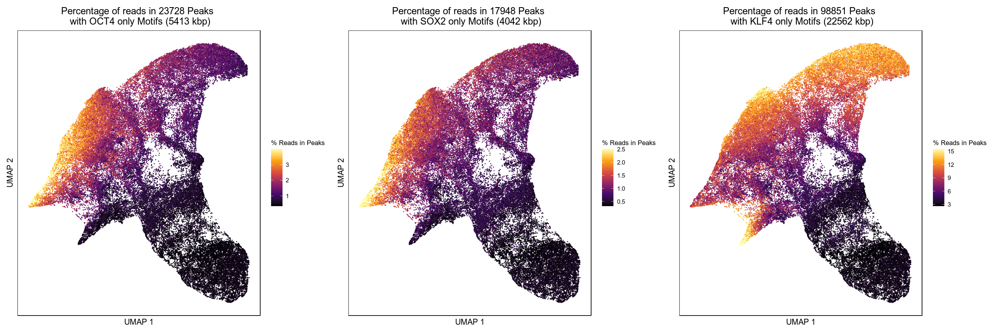

In [461]:
options(repr.plot.width = 21, repr.plot.height = 7)
plot_O_frip | plot_S_frip | plot_K_frip

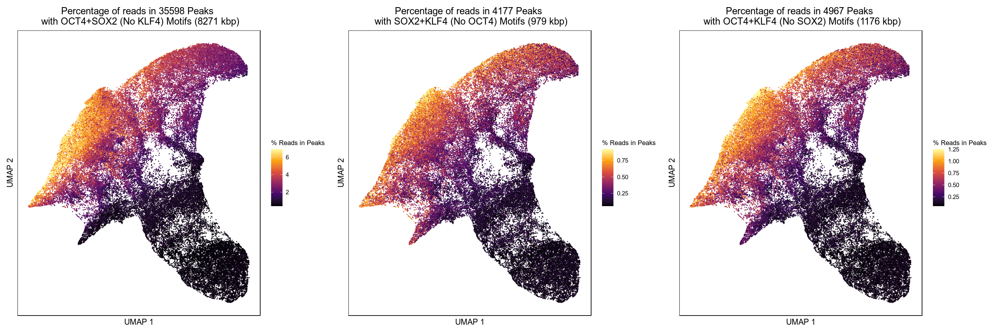

In [462]:
options(repr.plot.width = 21, repr.plot.height = 7)
plot_OS_frip | plot_SK_frip | plot_OK_frip

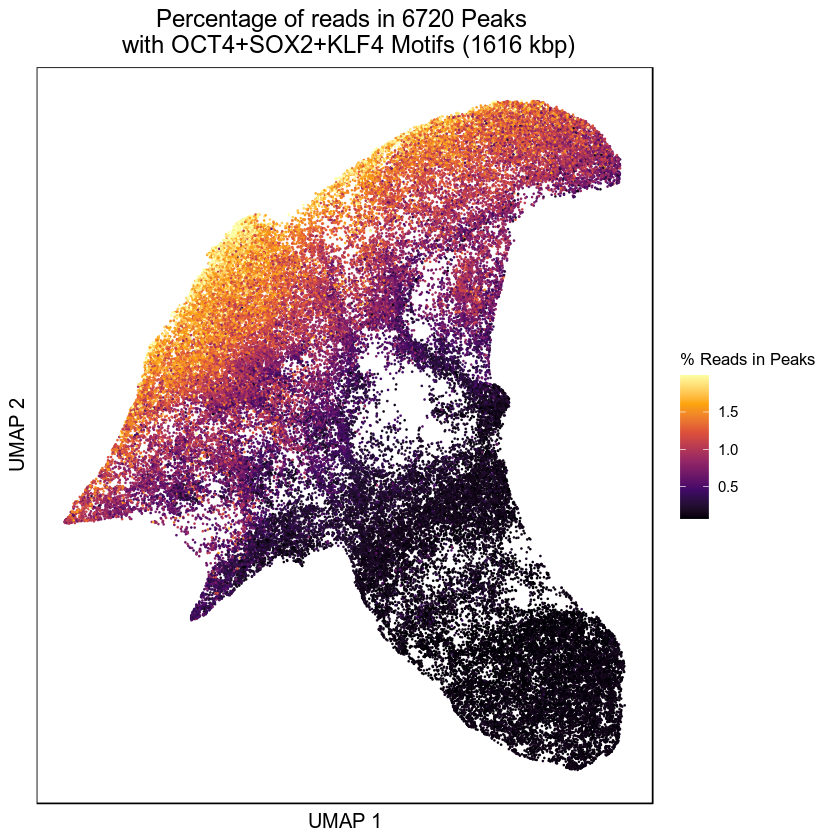

In [463]:
options(repr.plot.width = 7, repr.plot.height = 7)
plot_OSK_frip

## Normalized Cluster Reads in Peak Set Plots

In [111]:
# load fine clusters from file
fine_clusters = read.table("../20200206_pmat_snapATAC/sessions/20200520_n68916/fine_clusters.tsv", 
            header = T)
all(fine_clusters$sample_barcode==rownames(metaData))

clusters = fine_clusters$clusters
head(fine_clusters)

[1] TRUE

,sample_barcode,clusters
,<fct>,<int>
1,D0_AAACAACGACGATTAC,26
2,D0_AAACAACGAGCGCACT,42
3,D0_AAACACGCTACGCCAC,42
4,D0_AAACACGCTAGTACGG,11
5,D0_AAACACGCTCCTCAAA,13
6,D0_AAACACGCTCGAGTGA,10


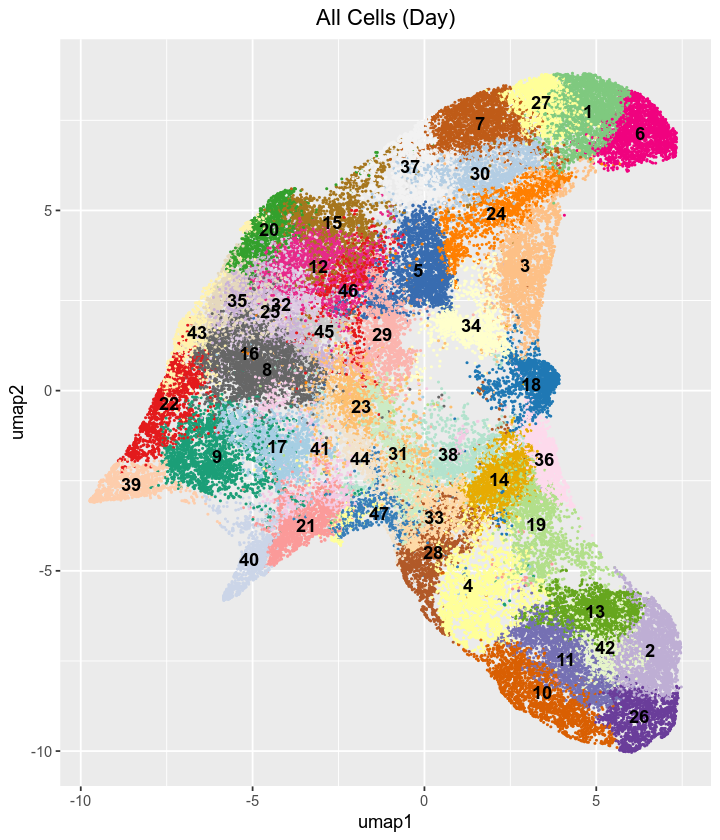

In [116]:
options(repr.plot.width = 6, repr.plot.height = 7)

df = data.frame(umap1=metaData$umap1, 
                umap2=metaData$umap2,
                clst=as.factor(clusters))
# shuffle so days don't overlap
df = df[sample(dim(df)[1]), ]

ggplot(df) +
# ggplot(df[df$x.sp.sample %in% c("D14"), ]) +
geom_point(size=0.2, alpha=1, aes(x=umap1 , y=umap2, col=clst)) +
# scale_color_brewer( palette = "Set1") +
scale_color_manual(values=col_vector) +
geom_text(data=data.frame(aggregate(metaData[,c("umap1","umap2")], 
                                    list(clusters), mean)),
         aes(x=umap1, y=umap2, label=Group.1), fontface = "bold") +
ggtitle("All Cells (Day)") + 
theme(plot.title = element_text(hjust = 0.5),
      legend.positio = "none")
# guides(colour = guide_legend(override.aes = list(shape=16, alpha=1, size=4))) 

In [117]:
agg_matrix = sparseMatrix(i=clusters,
                         j=seq(1,nrow(pmat)),
                         x=1L,
                         dims=c(length(table(clusters)), nrow(pmat)))

In [118]:
cts = as.matrix(agg_matrix %*% pmat)
colnames(cts) = sub("_", "-", sub("_", ":", rownames(regions)))
rownames(cts) = paste("cluster", seq(1,nrow(cts)), sep="_")
cts = t(cts)
head(cts)
dim(cts)

,cluster_1,cluster_2,cluster_3,cluster_4,cluster_5,cluster_6,cluster_7,cluster_8,cluster_9,cluster_10,⋯,cluster_38,cluster_39,cluster_40,cluster_41,cluster_42,cluster_43,cluster_44,cluster_45,cluster_46,cluster_47
chr1:97145604-97145864,2,32,30,25,18,4,5,41,39,74,⋯,23,5,9,16,12,6,20,9,15,8
chr1:7538148-7538363,9,68,35,51,6,4,9,68,34,143,⋯,34,5,8,23,20,3,23,37,20,22
chr1:93196678-93196894,1,42,2,7,0,1,2,9,11,20,⋯,3,7,0,2,2,0,2,5,0,0
chr1:187577713-187577913,1,25,4,0,0,0,0,18,2,16,⋯,4,2,1,0,2,6,2,8,1,0
chr1:53278065-53278265,6,21,7,4,2,1,3,21,13,15,⋯,10,1,5,21,7,7,7,6,10,5
chr1:177176832-177177032,0,2,2,1,3,1,0,47,31,1,⋯,0,28,0,0,1,71,2,7,1,0


[1] 803958     47

In [120]:
norm_cts = t(t(cts)/estimateSizeFactorsForMatrix(cts))
head(norm_cts)

,cluster_1,cluster_2,cluster_3,cluster_4,cluster_5,cluster_6,cluster_7,cluster_8,cluster_9,cluster_10,⋯,cluster_38,cluster_39,cluster_40,cluster_41,cluster_42,cluster_43,cluster_44,cluster_45,cluster_46,cluster_47
chr1:97145604-97145864,2.997351,13.5170639,14.7943893,29.671680,22.954602,6.790443,5.414005,13.054635,18.3846875,32.487630,⋯,20.230141,6.783652,12.158707,15.13240,18.985790,7.745208,26.388692,6.049669,14.6858164,17.75729
chr1:7538148-7538363,13.488080,28.7237609,17.2601209,60.530227,7.651534,6.790443,9.745208,21.651590,16.0276763,62.780151,⋯,29.905425,6.783652,10.807739,21.75282,31.642983,3.872604,30.346996,24.870863,19.5810885,48.83254
chr1:93196678-93196894,1.498676,17.7411464,0.9862926,8.308070,0.000000,1.697611,2.165602,2.865652,5.1854247,8.780441,⋯,2.638714,9.497113,0.000000,1.89155,3.164298,0.000000,2.638869,3.360927,0.0000000,0.00000
chr1:187577713-187577913,1.498676,10.5602062,1.9725852,0.000000,0.000000,0.000000,0.000000,5.731303,0.9428045,7.024353,⋯,3.518285,2.713461,1.350967,0.00000,3.164298,7.745208,2.638869,5.377484,0.9790544,0.00000
chr1:53278065-53278265,8.992053,8.8705732,3.4520242,4.747469,2.550511,1.697611,3.248403,6.686520,6.1282292,6.585330,⋯,8.795713,1.356730,6.754837,19.86127,11.075044,9.036076,9.236042,4.033113,9.7905442,11.09830
chr1:177176832-177177032,0.000000,0.8448165,0.9862926,1.186867,3.825767,1.697611,0.000000,14.965069,14.6134696,0.439022,⋯,0.000000,37.988452,0.000000,0.00000,1.582149,91.651630,2.638869,4.705298,0.9790544,0.00000


In [364]:
get_plot_norm_reads <- function(metaData, nrip, gr, title) {
    df = data.frame(metaData, log2_norm_reads=nrip)
    # shuffle so days don't overlap
    df = df[sample(dim(df)[1]), ]

    p <- ggplot(df) +
    # ggplot(df[df$x.sp.sample %in% c("D14"), ]) +
    geom_point(size=0.1, alpha=1, aes(x=umap1 , y=umap2, col=log2_norm_reads)) +
    ggtitle(sprintf("Total Normalized reads in %d Peaks \n with %s Motifs (%d kbp)",  
                   length(gr), title, as.integer(sum(width(gr))/1000))) + 
    xlab("UMAP 1") + ylab("UMAP 2") +
    scale_color_viridis_c(#limits=c(quantile(100*nrip, 0.01), 
                          #         quantile(100*nrip, 0.99)), 
                          oob=squish, option = "B") +
    theme_classic() +
    theme(plot.title = element_text(hjust = 0.5),
          text = element_text(size=12),
          axis.line=element_blank(),
          axis.text.x=element_blank(),
          axis.text.y=element_blank(),
          axis.ticks=element_blank(),
          legend.title=element_text(size=10), 
          legend.text=element_text(size=9),
          panel.border = element_rect(colour = "black", fill=NA, size=0.5)) 

    p   
}

In [423]:
norm_reads_in_O = log2(colSums(norm_cts[peaks_with_O_only,])[clusters])
norm_reads_in_S = log2(colSums(norm_cts[peaks_with_S_only,])[clusters])
norm_reads_in_K = log2(colSums(norm_cts[peaks_with_K_only,])[clusters])
norm_reads_in_OS = log2(colSums(norm_cts[peaks_with_OS,])[clusters])
norm_reads_in_SK = log2(colSums(norm_cts[peaks_with_SK,])[clusters])
norm_reads_in_OK = log2(colSums(norm_cts[peaks_with_OK,])[clusters])
norm_reads_in_OSK = log2(colSums(norm_cts[peaks_with_OSK,])[clusters])

In [424]:
plot_O_nrip = get_plot_norm_reads(metaData, norm_reads_in_O, peaks_gr[peaks_with_O_only], "OCT4 only")
plot_S_nrip = get_plot_norm_reads(metaData, norm_reads_in_S, peaks_gr[peaks_with_S_only], "SOX2 only")
plot_K_nrip = get_plot_norm_reads(metaData, norm_reads_in_K, peaks_gr[peaks_with_K_only], "KLF4 only")

In [425]:
plot_OS_nrip = get_plot_norm_reads(metaData, norm_reads_in_OS, peaks_gr[peaks_with_OS], "OCT4+SOX2 (No KLF4)")
plot_SK_nrip = get_plot_norm_reads(metaData, norm_reads_in_SK, peaks_gr[peaks_with_SK], "SOX2+KLF4 (No OCT4)")
plot_OK_nrip = get_plot_norm_reads(metaData, norm_reads_in_OK, peaks_gr[peaks_with_OK], "OCT4+KLF4 (No SOX2)")
plot_OSK_nrip = get_plot_norm_reads(metaData, norm_reads_in_OSK, peaks_gr[peaks_with_OSK], "OCT4+SOX2+KLF4")

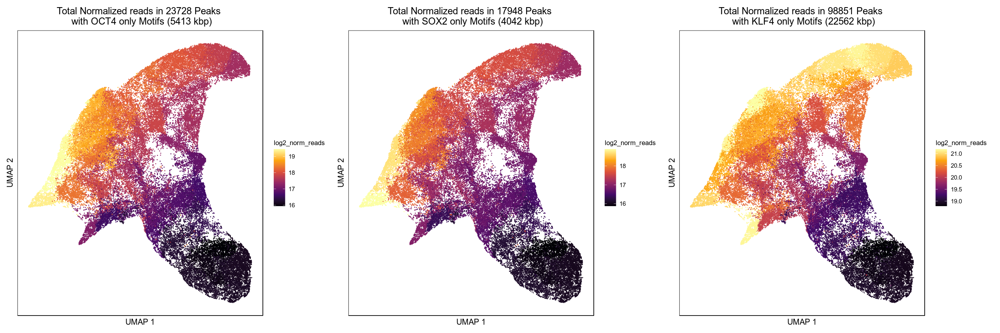

In [426]:
options(repr.plot.width = 21, repr.plot.height = 7)
plot_O_nrip | plot_S_nrip | plot_K_nrip

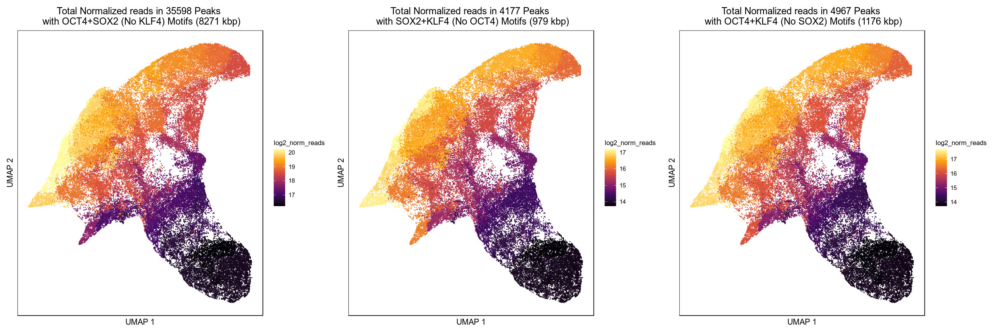

In [427]:
options(repr.plot.width = 21, repr.plot.height = 7)
plot_OS_nrip | plot_SK_nrip | plot_OK_nrip

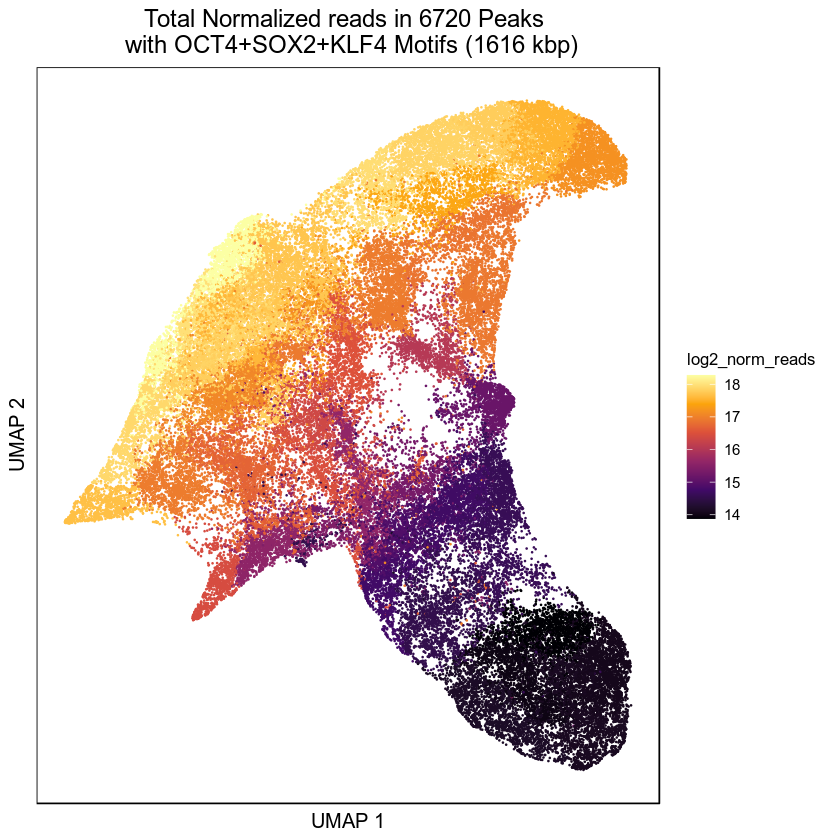

In [428]:
options(repr.plot.width = 7, repr.plot.height = 7)
plot_OSK_nrip